# Import libraries

 Option 1
 &emsp;
plt.rcParams['font.size'] = 18
Option 2
plt.rcParams.update({'font.size': 18})

In [500]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# Reading Data

In [501]:
# reading the CSV dataset fil
df = pd.read_csv('../datasets/no1_aggregated/no1_2020_to_2022_aggregated.csv', index_col=0)

# 5 first rows of the dataset
df.head()

,end MTU (UTC),Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020-01-01 01:00:00,31.77,31.77,28.45,31.77,28.45,4333.0,4139.0,3016.0,1950.0,...,0.0,1449.0,0.0,391,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 01:00:00,2020-01-01 02:00:00,31.57,31.57,27.90,31.57,27.90,4250.0,4114.0,2945.0,1926.0,...,0.0,1283.0,0.0,348,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 02:00:00,2020-01-01 03:00:00,31.28,31.28,27.52,31.28,27.52,4167.0,4030.0,3032.0,1913.0,...,6.0,962.0,0.0,500,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 03:00:00,2020-01-01 04:00:00,30.72,30.72,27.54,30.72,27.54,4145.0,4032.0,2988.0,1894.0,...,6.0,767.0,0.0,610,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 04:00:00,2020-01-01 05:00:00,30.27,30.27,26.55,30.27,26.55,4222.0,4032.0,2848.0,1901.0,...,22.0,642.0,0.0,909,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0


57 columns in total and there are 26304 records as expected. all the features are numerical except end MTU (UTC).

In [502]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26304 entries, 2020-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 57 columns):
 #   Column                                                                         Non-Null Count  Dtype  
---  ------                                                                         --------------  -----  
 0   end MTU (UTC)                                                                  26304 non-null  object 
 1   Day-ahead Price [EUR/MWh] BZN|NO1                                              26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO2                                              26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO3                                              26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|NO5                                              26304 non-null  float64
 5   Day-ahead Price [EUR/MWh] BZN|SE3                                              26304 non-null  float64


In [503]:
# Renaming column names to make it easier to plot and read the graphs
df = df.rename(columns={
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1' ,
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3'}
)

Removing the 'end MTU' column from the dataframe. We know each row is an hourly collected observation. There is no need to define the start and end time , only start time is necessary.

In [504]:
df.drop('end MTU (UTC)', inplace =True,  axis = 1)

In [505]:
 # Target/dependent column and input/independent columns
df_target_column = df['Day-ahead Price [EUR/MWh] BZN|NO1']

df_without_target = df.drop('Day-ahead Price [EUR/MWh] BZN|NO1', axis = 1)


### Indexing and reindexing , convert the time index to Datetime type from Object type.

In [506]:
# Separate the Datetime column (index), to convert it from Object to Datetime
df = df.reset_index()
# we kan see the 'start MTU (UTC)' as first column, having datatype object
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26304 entries, 0 to 26303
Data columns (total 57 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   start MTU (UTC)                                          26304 non-null  object 
 1   Day-ahead Price [EUR/MWh] BZN|NO1                        26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO2                        26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO3                        26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|NO5                        26304 non-null  float64
 5   Day-ahead Price [EUR/MWh] BZN|SE3                        26304 non-null  float64
 6   Actual Total Load [MW] - BZN|NO1                         26303 non-null  float64
 7   Actual Total Load [MW] - BZN|NO2                         26303 non-null  float64
 8   Actual Total Load [MW] - B

In [507]:
## Start MTU (UTC) is converted and using set_index() we want to set it as the index as it was before.
df['start MTU (UTC)'] = pd.to_datetime(df['start MTU (UTC)'])

# set 'start MTU (UTC)' as the index
df = df.set_index('start MTU (UTC)', drop = True)

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26304 entries, 2020-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 56 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Day-ahead Price [EUR/MWh] BZN|NO1                        26304 non-null  float64
 1   Day-ahead Price [EUR/MWh] BZN|NO2                        26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO3                        26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO5                        26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|SE3                        26304 non-null  float64
 5   Actual Total Load [MW] - BZN|NO1                         26303 non-null  float64
 6   Actual Total Load [MW] - BZN|NO2                         26303 non-null  float64
 7   Actual Total Load [MW] - BZN|NO3                         26303 non-null  floa

# Exploratory data analysis
EDA is quite iterative , we often had to redo parts of analysis after discovering some important information. EDA for this dataset has the following sections:
1. **Structure Investigation** : Shape of dataset , features datatype, number of unique sample for each feature
2. **Quality Investigation** : Duplicate, missing , outliers and unwanted values
3. **Content Investigation** : Feature distribution. Pair-plotting, Feature correlation

## 1. Structure Investigation

In [508]:
# Our dataset is containing 26304 records and 56 features
df.shape

(26304, 56)

In [509]:
# Count number of data types in the dataset, all features are numerical
pd.value_counts(df.dtypes)

float64    53
int64       3
dtype: int64

Using .describe () will help us find big anomalies and get a feeling for distribution of each feature.

- First thing to highlight is that min value for day-ahead prices is negative (-1,97 EUR)
- Another interesting fact is that electricity is almost 300 % cheaper in NO3 compared to other bidding zones. Looking at mean values : NO3=30 EUR , NO1 =92 EUR ,NO2 =98 EUR, NO5 =91 EUR ,
SE3 =72 EUR.
- 75 % of prices in NO1 is higher than the mean value for prices in NO1. This indicates seasons/timeperiod very high electricity prices.

For further investigation it is easier to look at each feature as a part of a category for example price, import&export, load , generation and water reservoir categories. This part is done after a analysing and studying the dataset as a whole. (After Content Investigation)

In [510]:
df.describe()

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
count,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26303.000000,26303.000000,26303.000000,26303.000000,26304.000000,...,26273.000000,26273.000000,26273.000000,26304.000000,26304.000000,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04
mean,92.089895,98.477096,30.802730,91.868445,72.083614,3943.992891,4179.527354,3137.688020,1901.222028,9771.786915,...,12.051726,1398.770753,12.165836,341.181531,454.188412,3.579091e+06,2.073493e+07,5.731948e+06,9.658894e+06,1.716409e+06
std,102.673358,114.521343,44.767859,102.347340,93.332389,1259.769412,748.668751,485.748914,329.930577,2129.143862,...,39.269949,798.985462,73.549470,497.663086,569.062045,1.582598e+06,6.634143e+06,2.070706e+06,4.128414e+06,3.500652e+05
min,-1.970000,-1.970000,-2.080000,-0.090000,-2.080000,1446.000000,1595.000000,1751.000000,1036.000000,4778.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,4.853340e+05,6.334677e+06,1.691000e+06,1.624537e+06,8.330000e+05
25%,12.530000,12.537500,8.090000,12.617500,16.780000,2922.000000,3574.000000,2748.000000,1647.000000,8110.000000,...,0.000000,827.000000,0.000000,0.000000,0.000000,2.165300e+06,1.671733e+07,4.008874e+06,6.311281e+06,1.546000e+06
50%,54.950000,57.530000,17.625000,54.850000,39.425000,3755.000000,4070.000000,3097.000000,1847.000000,9504.500000,...,0.000000,1402.000000,0.000000,0.000000,67.000000,4.014420e+06,2.026900e+07,6.248826e+06,1.016200e+07,1.733000e+06
75%,140.860000,143.380000,39.980000,140.735000,86.072500,4856.000000,4719.000000,3499.000000,2137.000000,11267.000000,...,0.000000,1935.000000,0.000000,591.000000,895.000000,4.797228e+06,2.427300e+07,7.487797e+06,1.242700e+07,2.019000e+06
max,799.970000,844.000000,590.000000,799.970000,799.970000,7919.000000,7072.000000,5694.000000,4326.000000,16744.000000,...,672.000000,3477.000000,1052.000000,2520.000000,2325.000000,5.919000e+06,3.338800e+07,8.737000e+06,1.645900e+07,2.245000e+06


There are 11 prices equal or below zero EUR, Negative prices occur when supply offered at negative prices is greater than demand. Negative prices are a signal to either increase demand or reduce supply. negative prices occur in the wholesale electricity market and do not occur in the retail electricity market. Most of them are at the end/* of 2020

In [511]:
negative_prices = df[df["Day-ahead Price [EUR/MWh] BZN|NO1"] <= 0]
negative_prices

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-07-06 00:00:00,0.00,0.00,0.00,0.00,0.00,2193.0,2904.0,2242.0,1460.0,6106,...,0.0,0.0,189.0,822,0,5329000.0,29467000.0,7930000.0,13279000.0,2099000.0
2020-07-06 02:00:00,-0.09,-0.09,1.36,-0.09,-0.09,2129.0,3031.0,2142.0,1467.0,6007,...,0.0,0.0,443.0,1197,0,5329000.0,29467000.0,7930000.0,13279000.0,2099000.0
2020-11-02 00:00:00,-0.04,-0.04,1.49,0.94,-0.04,3305.0,3610.0,2559.0,1764.0,7568,...,154.0,0.0,386.0,1587,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 01:00:00,-0.93,-0.93,1.69,0.83,-0.93,3205.0,3708.0,2554.0,1771.0,7431,...,201.0,0.0,453.0,1417,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 02:00:00,-1.73,-1.73,1.48,0.81,-1.73,3165.0,3661.0,2483.0,1770.0,7425,...,249.0,0.0,457.0,961,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 03:00:00,-1.36,-1.36,1.43,0.84,-1.36,3197.0,3787.0,2495.0,1765.0,7505,...,238.0,0.0,459.0,1039,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2021-10-02 23:00:00,-0.03,-0.03,0.48,34.39,-0.03,2811.0,3526.0,2757.0,1618.0,7066,...,209.0,0.0,687.0,935,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0
2021-10-03 00:00:00,-1.02,-1.02,0.21,23.61,-1.02,2802.0,3514.0,2705.0,1601.0,6962,...,250.0,0.0,767.0,654,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0
2021-10-03 01:00:00,-1.91,-1.91,0.06,18.26,-1.91,2685.0,3493.0,2797.0,1600.0,6845,...,272.0,0.0,821.0,724,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0


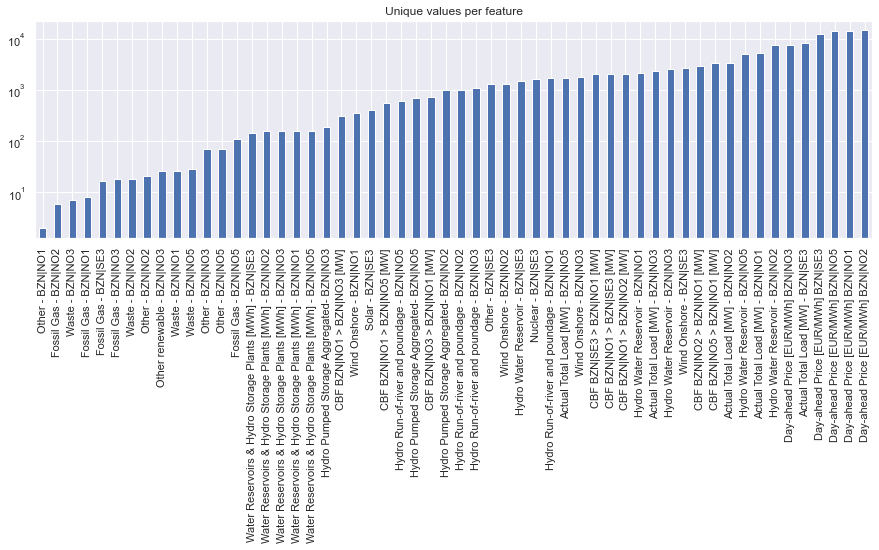

In [512]:
# For each numerical feature compute number of unique entries
unique_values = df.select_dtypes(include="number").nunique().sort_values()

# Plot information with y-axis in log-scale
unique_values.plot.bar(logy=True, figsize=(15, 4), title="Unique values per feature");

It is a good solution to analyse all 56 columns as 5 main categories;

Price :
> Day-ahead Price [EUR/MWh] for NO1, NO2, NO3, NO5, SE3

Load:
> Actual Total Load [MW] for NO1, NO2, NO3, NO5, SE3

Generation per unit type [MW]:
> Fossil Gas
         Nuclear
         Waste
         Wind Onshore
         Hydro Pumped Storage
         Hydro Run-of-river and poundage
         Other

Import and export :
> Import and export between NO1 and NO2,NO3,NO5,SE3 [MW]

Water Reservoirs and Hydro Storage Plants' stored energy value [MW]:
> Hydro Water Reservoir for NO1, NO2, NO3, NO5, SE3

First 5 features from left corner of the plot above have the fewest unique values.
- We start by **'Other - BZN|NO1'**. There is a very low variance and 99.9 % of values are 0's. Rest of values are 1's.
&emsp;
- The percentage of 0's in **'Fossil Gas - BZN|NO2'** is 0.8 and the percentage of 4's in 'Fossil Gas - BZN|NO2' is 0.17 . There is a very low variance
&emsp;
- The percentage of 0's in **'Waste - BZN|NO3'** is 0.34. The percentage of values under 6 MW in 'Waste - BZN|NO3' is 0.84
&emsp;
- The percentage of 0's in **'Fossil Gas - BZN|NO1'** is 0.83, by plotting 'Fossil Gas - BZN|NO1' we understand generation is 0 after July 2020. Since data is not consistent and can not be used for our model , we shall drop 'Fossil Gas - BZN|NO1'.
&emsp;
- The percentage of 0's in 'Fossil Gas - BZN|SE3' is 0.99, after plotting the feature over 3 years , we understand that there are no generation in 2020 and 2021, only in 2022.


#### Other - BZN|NO1

In [513]:
# Examine how often specific values occur in a column: (low variance)
distinct_values_Other_NO1 =df['Other - BZN|NO1'].value_counts()
distinct_values_Other_NO1

0.0    26280
1.0       24
Name: Other - BZN|NO1, dtype: int64

In [514]:
# The percentage of 0's in 'Other - BZN|NO1'
df['Other - BZN|NO1'].where(df['Other - BZN|NO1'] == 0).count()/ df.shape[0]

0.9990875912408759

#### Fossil Gas - BZN|NO2

In [515]:
# Examine how often specific values occur in a column
distinct_values_gas_NO1 =df['Fossil Gas - BZN|NO2'].value_counts()
distinct_values_gas_NO1

0.0    21093
4.0     4517
3.0      551
5.0      129
2.0        7
1.0        1
Name: Fossil Gas - BZN|NO2, dtype: int64

In [516]:
# The percentage of 0's in 'Fossil Gas - BZN|NO2' is 0.8
# The percentage of 4's in 'Fossil Gas - BZN|NO2' is 0.17
df['Fossil Gas - BZN|NO2'].where(df['Fossil Gas - BZN|NO2'] == 0).count()/ df.shape[0]
df['Fossil Gas - BZN|NO2'].where(df['Fossil Gas - BZN|NO2'] == 4).count()/ df.shape[0]


0.1717229318734793

#### 'Waste - BZN|NO3’
Electricity generation values under 6 MW represents very negligible production, mean value for daily load NO1 is 39000 MW. Therefore, values under 6MW are very unlikely to indicate price changes or be useful for our model.

In [517]:
# The percentage of 0's in 'Waste - BZN|NO3' is 0.34
df['Waste - BZN|NO3'].where(df['Waste - BZN|NO3'] == 0).count()/ df.shape[0]
# The percentage of values under 6 MW in 'Waste - BZN|NO3' is 0.84
df['Waste - BZN|NO3'].where(df['Waste - BZN|NO3'] < 6).count()/ df.shape[0]

0.8419631995133819

In [518]:
distinct_values_waste_N03 =df['Waste - BZN|NO3'].value_counts()
distinct_values_waste_N03

0.0    9173
6.0    4152
5.0    3405
4.0    2854
1.0    2545
2.0    2130
3.0    2040
Name: Waste - BZN|NO3, dtype: int64

#### Fossil Gas - BZN|NO

In [519]:
# The percentage of 0's in 'Fossil Gas - BZN|NO1' is 0.83
df['Fossil Gas - BZN|NO1'].where(df['Fossil Gas - BZN|NO1'] == 0).count()/ df.shape[0]

0.8329151459854015

In [520]:
distinct_values_gas_NO1 =df['Fossil Gas - BZN|NO1'].value_counts()
distinct_values_gas_NO1

0.0     21909
22.0     2611
25.0     1530
23.0      153
13.0       48
12.0       24
20.0       13
24.0       11
Name: Fossil Gas - BZN|NO1, dtype: int64

Generation is 0 after July 2020, cannot be used for our model.

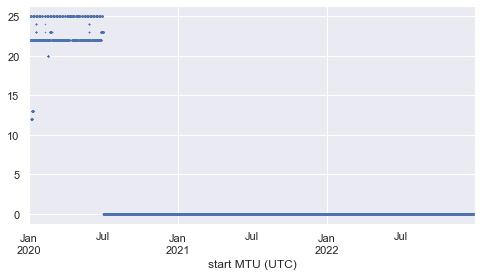

In [521]:
df['Fossil Gas - BZN|NO1'].plot(lw=0, marker=".", markersize=1 , figsize = (8,4));

#### Fossil Gas - BZN|SE3

In [522]:
distinct_values_gas_SE3 =df['Fossil Gas - BZN|SE3'].value_counts()
distinct_values_gas_SE3

0.0     26209
90.0       35
45.0       27
15.0       10
11.0        3
3.0         3
54.0        2
20.0        2
26.0        2
17.0        2
7.0         2
5.0         1
87.0        1
24.0        1
40.0        1
64.0        1
27.0        1
Name: Fossil Gas - BZN|SE3, dtype: int64

In [523]:
# The percentage of 0's in 'Fossil Gas - BZN|SE3' is 0.99
df['Fossil Gas - BZN|SE3'].where(df['Fossil Gas - BZN|SE3'] == 0).count()/ df.shape[0]

0.9963883819951338

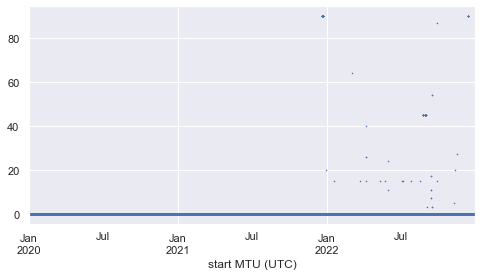

In [524]:
df['Fossil Gas - BZN|SE3'].plot(lw=0, marker="*", markersize=1, figsize = (8,4));

## 2. Quality Investigation

### Missing values
we should handle missing values after splitting to avoid data leakage.

In [525]:
# Missing values in each colum in descending order, ' Other renewable - BZN|NO3' column has the most missing values(73).
missing_val_per_feature= df.isna().sum().sort_values(ascending = False)
missing_val_per_feature

Other renewable - BZN|NO3                                  73
CBF BZN|NO1 > BZN|NO3 [MW]                                 31
CBF BZN|NO1 > BZN|NO2 [MW]                                 31
CBF BZN|NO2 > BZN|NO1 [MW]                                 31
CBF BZN|NO5 > BZN|NO1 [MW]                                 31
CBF BZN|NO1 > BZN|NO5 [MW]                                 31
CBF BZN|NO3 > BZN|NO1 [MW]                                 31
Fossil Gas - BZN|NO2                                        6
Hydro Water Reservoir - BZN|NO3                             5
Waste - BZN|NO2                                             5
Waste - BZN|NO5                                             5
Hydro Water Reservoir - BZN|NO5                             5
Hydro Run-of-river and poundage - BZN|NO5                   5
Hydro Pumped Storage Aggregated- BZN|NO5                    5
Fossil Gas - BZN|NO5                                        5
Wind Onshore - BZN|NO3                                      5
Waste - 

In [526]:
# % of missing values in each feature in descending order
# 'Other renewable - BZN|NO3' has most percentage of missing values.
mis_val_percent = 100 * df.isnull().sum() / len(df)
mis_val_percent.sort_values(ascending= False)

Other renewable - BZN|NO3                                  0.277524
CBF BZN|NO1 > BZN|NO3 [MW]                                 0.117853
CBF BZN|NO1 > BZN|NO2 [MW]                                 0.117853
CBF BZN|NO2 > BZN|NO1 [MW]                                 0.117853
CBF BZN|NO5 > BZN|NO1 [MW]                                 0.117853
CBF BZN|NO1 > BZN|NO5 [MW]                                 0.117853
CBF BZN|NO3 > BZN|NO1 [MW]                                 0.117853
Fossil Gas - BZN|NO2                                       0.022810
Hydro Water Reservoir - BZN|NO3                            0.019009
Waste - BZN|NO2                                            0.019009
Waste - BZN|NO5                                            0.019009
Hydro Water Reservoir - BZN|NO5                            0.019009
Hydro Run-of-river and poundage - BZN|NO5                  0.019009
Hydro Pumped Storage Aggregated- BZN|NO5                   0.019009
Fossil Gas - BZN|NO5                            

In [527]:
# There are 102 rows missing values for at least one feature. 2020-01-13 is a complete day with missing valus for import and export within Norwegian bidding zones.
df[df.isna().any(axis=1)]

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-01-12 23:00:00,24.92,24.92,22.52,24.92,22.52,4688.0,4442.0,3263.0,2011.0,9848,...,NaN,NaN,NaN,1750,0,3844000.0,24560000.0,5541000.0,11074000.0,2189000.0
2020-01-13 00:00:00,24.54,24.54,23.91,24.54,23.91,4427.0,4354.0,3172.0,1986.0,9747,...,NaN,NaN,NaN,1442,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 01:00:00,24.66,24.66,23.96,24.66,23.96,4387.0,4365.0,3192.0,1972.0,9741,...,NaN,NaN,NaN,1449,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 02:00:00,24.85,24.85,24.26,24.85,24.26,4402.0,4402.0,3114.0,1964.0,9830,...,NaN,NaN,NaN,1351,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 03:00:00,25.33,25.33,25.01,25.33,25.01,4506.0,4417.0,3193.0,2027.0,10047,...,NaN,NaN,NaN,1372,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-03 12:00:00,58.92,51.79,50.31,58.92,58.92,7132.0,5878.0,4296.0,2691.0,15182,...,0.0,2788.0,0.0,0,1433,3195000.0,24358000.0,4917000.0,9289000.0,1612000.0
2021-02-15 13:00:00,50.28,50.28,46.09,50.28,50.28,7554.0,6246.0,4183.0,2651.0,14399,...,0.0,2857.0,0.0,0,824,2581663.0,21997976.0,4169409.0,7744098.0,1341000.0
2021-06-16 11:00:00,50.09,50.09,33.41,50.09,70.45,3292.0,3792.0,2809.0,1789.0,9204,...,4.0,1832.0,0.0,0,1372,4270695.0,22198664.0,6275868.0,8674483.0,2026000.0


### Duplicate Values
Since proving that the two concentrations are under the exact same conditions , is impossible for us. We trust the datasource for this dataset which is European Network of Transmission System Operators for Electricity(https://transparency.entsoe.eu/).

### Unwanted and invalid values :

Invalid values can be even more dangerous than missing values, they are often more challenging to detect. Based on our analysis there are no unwanted values , only NaN values which will be handled after EDA in cleaning process.

### Outliers :
Outliers represent measurement errors, data entry or processing errors, or poor sampling
Not all outliers are problematic some outliers represent natural variations in the population, and they should be left as is in the dataset. These are called true outliers. We do not have any reason to remove outliers , we trust our dataprovider(entso-e).

But we are going to study outliers ...

https://statisticsbyjim.com/basics/remove-outliers/#:~:text=Removing%20outliers%20is%20legitimate%20only,the%20process%20or%20study%20area.

https://towardsdatascience.com/5-ways-to-detect-outliers-that-every-data-scientist-should-know-python-code-70a54335a623


## 3. Content Investigation


### Plotting all features
To study trend, seasonality and distribution for each feature.

- lw=0: lw stands for line width. 0 means that we don’t want to show any lines
&emsp;
- marker=".": Instead of lines, we tell the plot to use . as markers for each data point
&emsp;
- layout=(-1, 4): This parameter tells pandas how many rows and columns to use for the subplots.
The -1 means “as many as needed”, while the 2 means to use 2 columns per row.
&emsp;
- figsize=(20, 55), markersize=1: To make sure that the figure is big enough, figure height is roughly the number of features

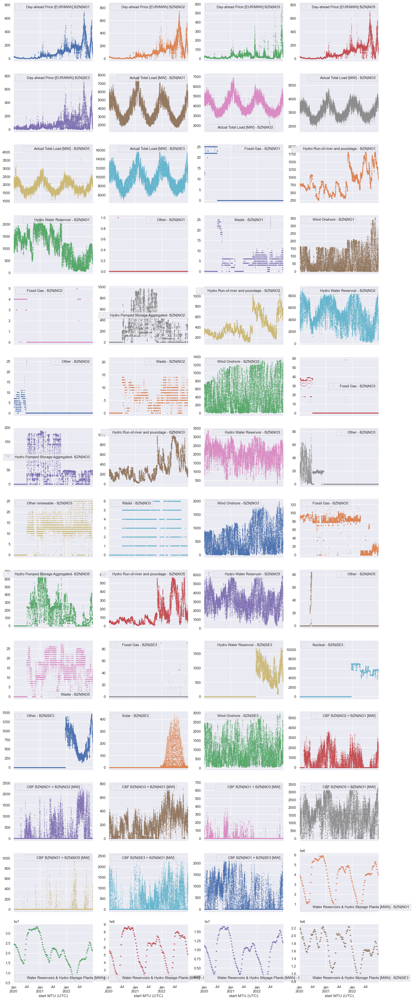

In [528]:
df.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(20, 55), markersize=1);


### Feature distribution

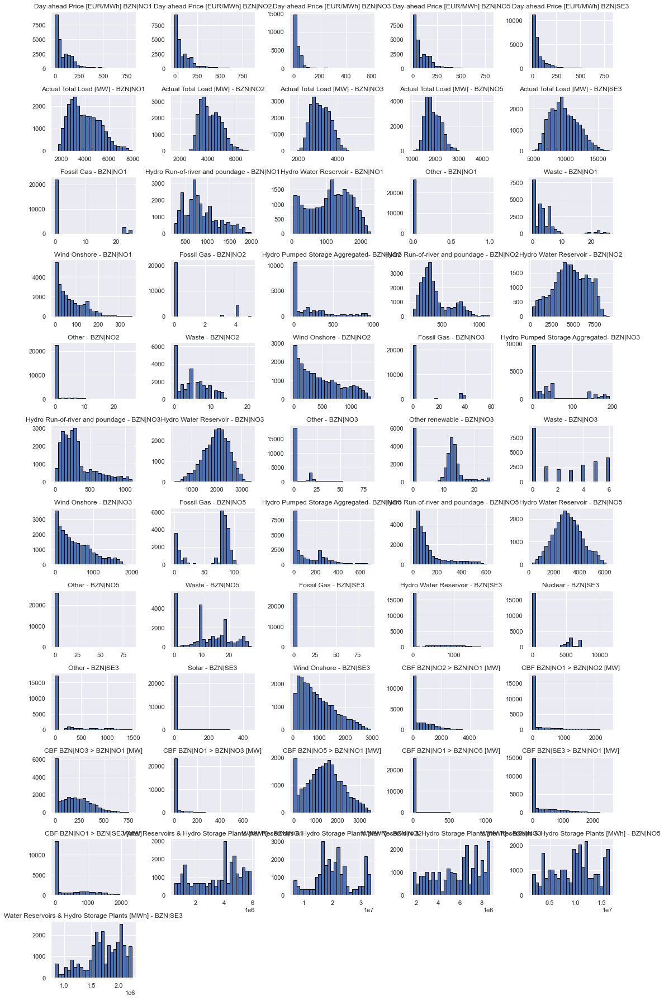

In [529]:
# Plots the histogram for each numerical feature in a separate subplot
df.hist(bins=25, figsize=(15, 25), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

In [530]:
# Creates mask to identify numerical features with more or less than 25 unique features
cols_continuous = df.select_dtypes(include="number").nunique() >= 25
cols_continuous

Day-ahead Price [EUR/MWh] BZN|NO1                           True
Day-ahead Price [EUR/MWh] BZN|NO2                           True
Day-ahead Price [EUR/MWh] BZN|NO3                           True
Day-ahead Price [EUR/MWh] BZN|NO5                           True
Day-ahead Price [EUR/MWh] BZN|SE3                           True
Actual Total Load [MW] - BZN|NO1                            True
Actual Total Load [MW] - BZN|NO2                            True
Actual Total Load [MW] - BZN|NO3                            True
Actual Total Load [MW] - BZN|NO5                            True
Actual Total Load [MW] - BZN|SE3                            True
Fossil Gas - BZN|NO1                                       False
Hydro Run-of-river and poundage - BZN|NO1                   True
Hydro Water Reservoir - BZN|NO1                             True
Other - BZN|NO1                                            False
Waste - BZN|NO1                                             True
Wind Onshore - BZN|NO1   

In [531]:
# Create a new dataframe which only contains the continuous features
df_continuous = df[cols_continuous[cols_continuous].index]
df_continuous.shape

(26304, 48)

### Pair-plot()

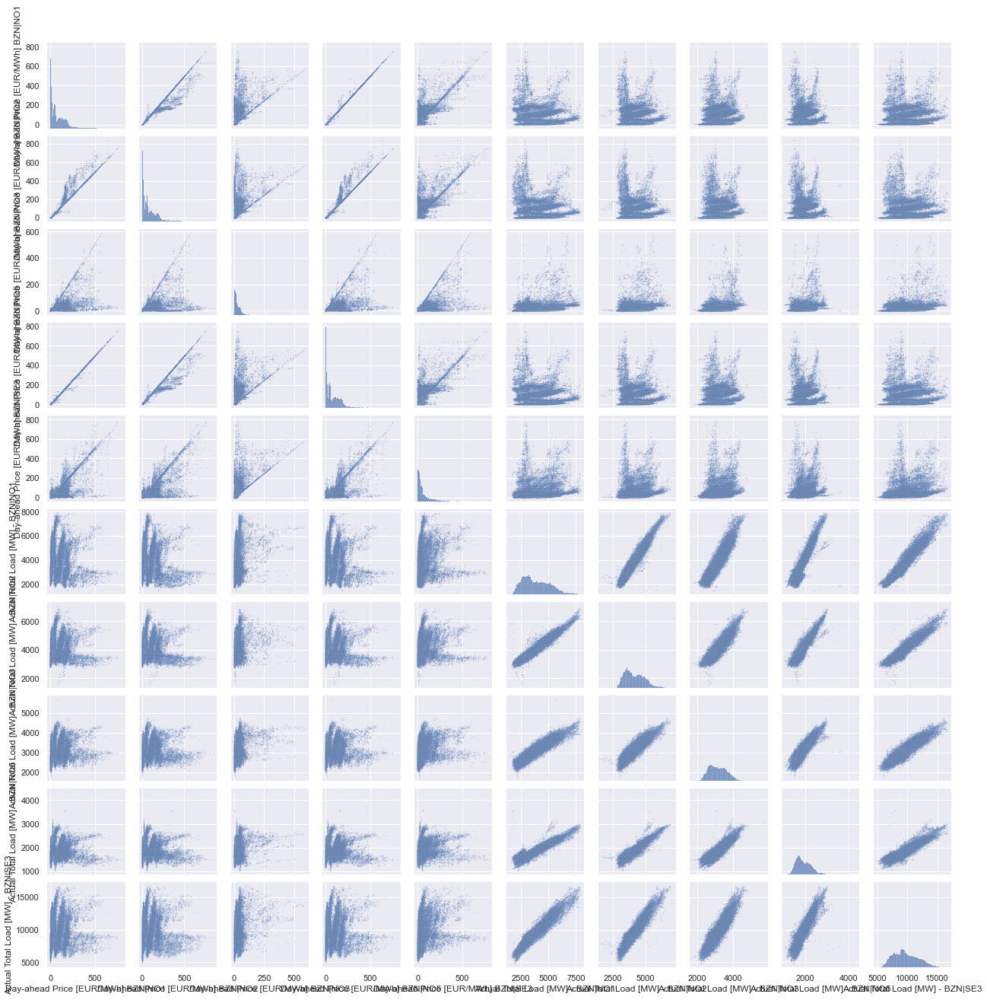

In [532]:
# Pair-plot for first 10 columns
first = df_continuous.iloc[:, 0:10]

sns.set(font_scale = 1)
fig = sns.pairplot( first, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

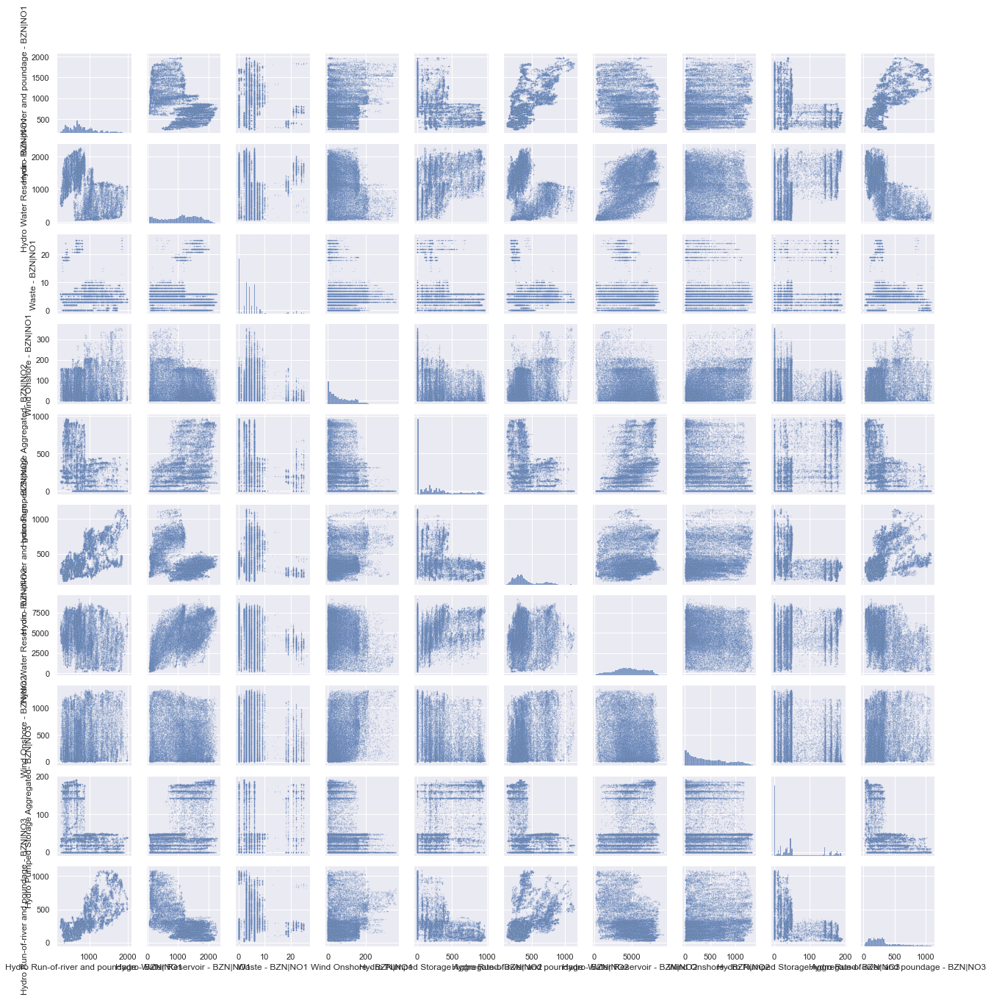

In [533]:
first = df_continuous.iloc[:, 10:20]

sns.set(font_scale = 1)
fig = sns.pairplot( first, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

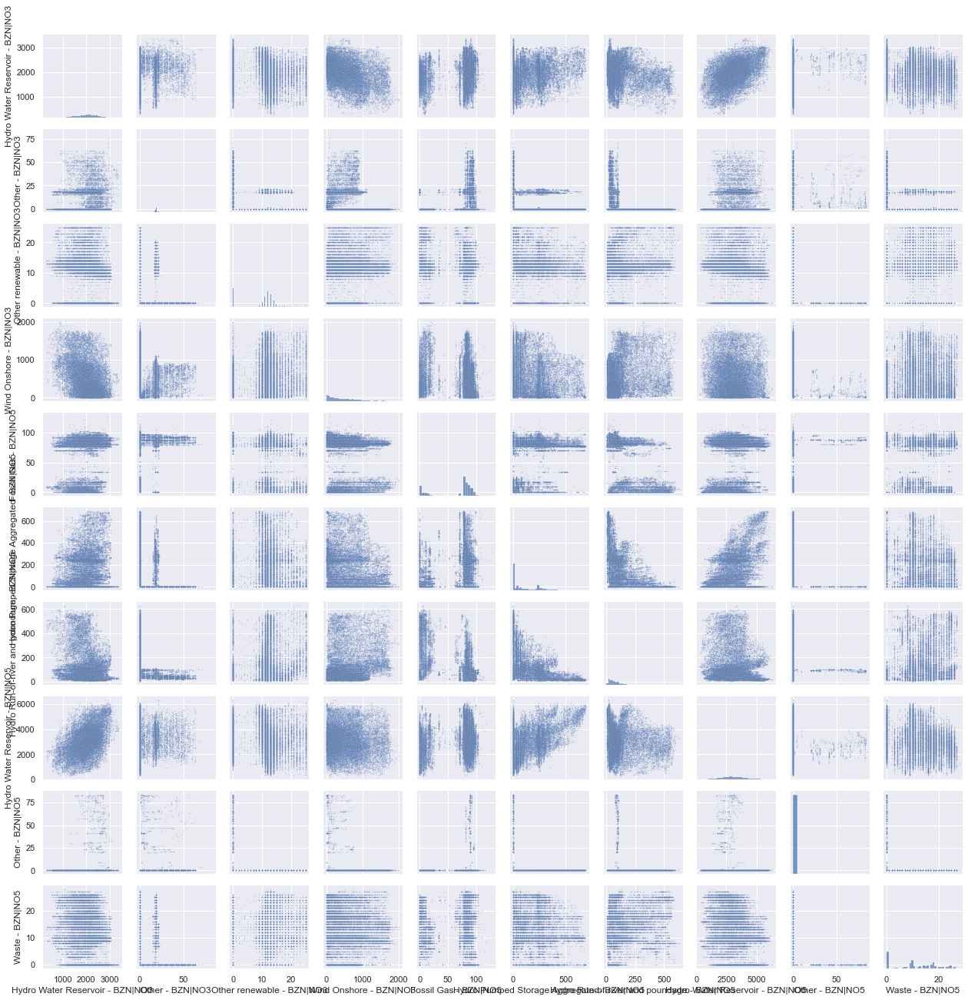

In [534]:
second = df_continuous.iloc[:, 20:30]

sns.set(font_scale = 1)
fig = sns.pairplot( second, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

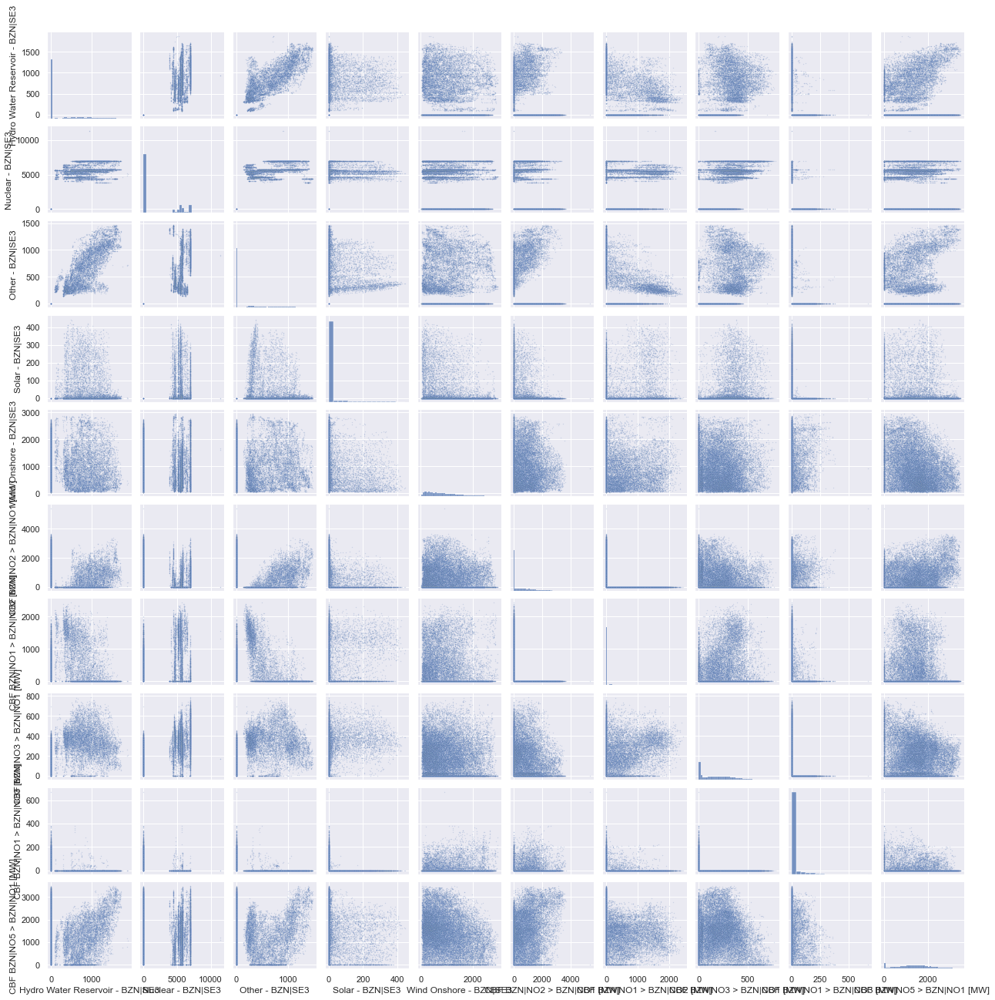

In [535]:
third = df_continuous.iloc[:, 30:40]

sns.set(font_scale = 1)
fig = sns.pairplot( third, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

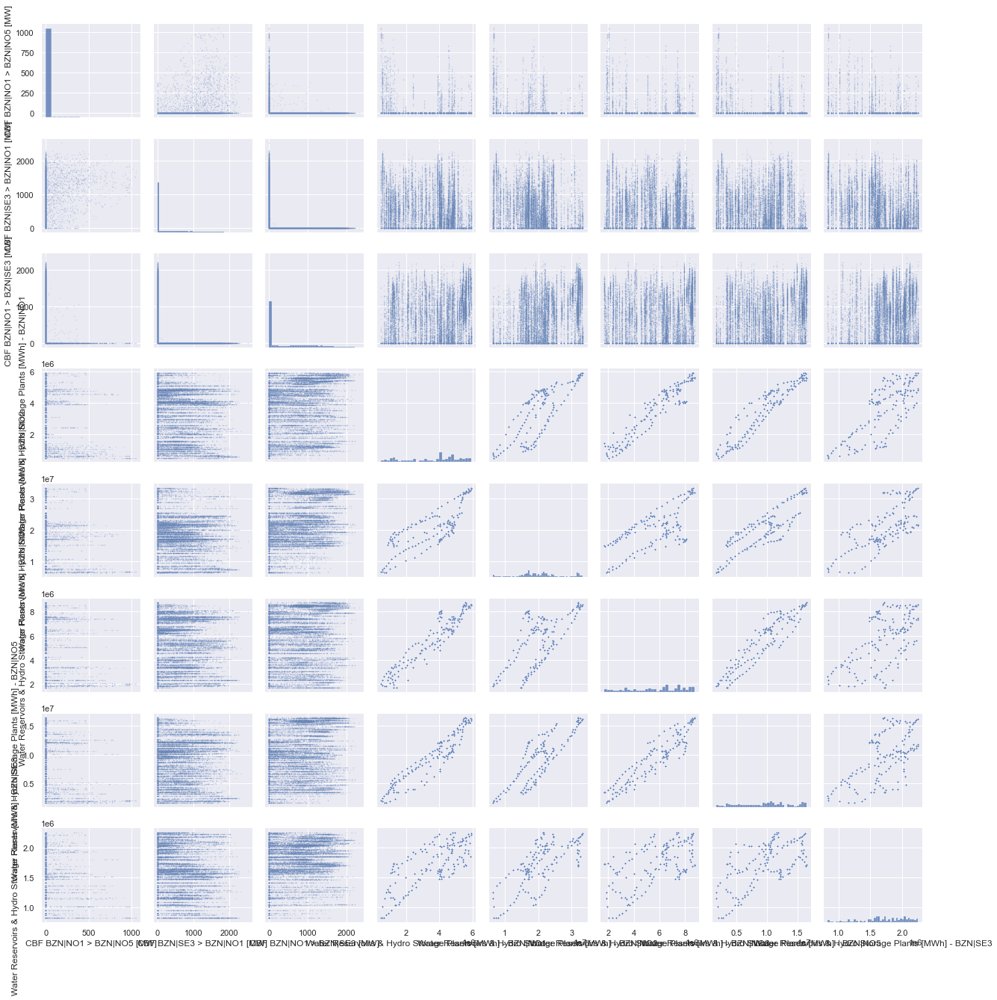

In [536]:
fourth = df_continuous.iloc[:, 40:48]

sns.set(font_scale = 1)
fig = sns.pairplot( fourth, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

### Feature Correlation

C:\Users\Isak\AppData\Local\Temp\ipykernel_37984\1638426565.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = plt.colorbar()


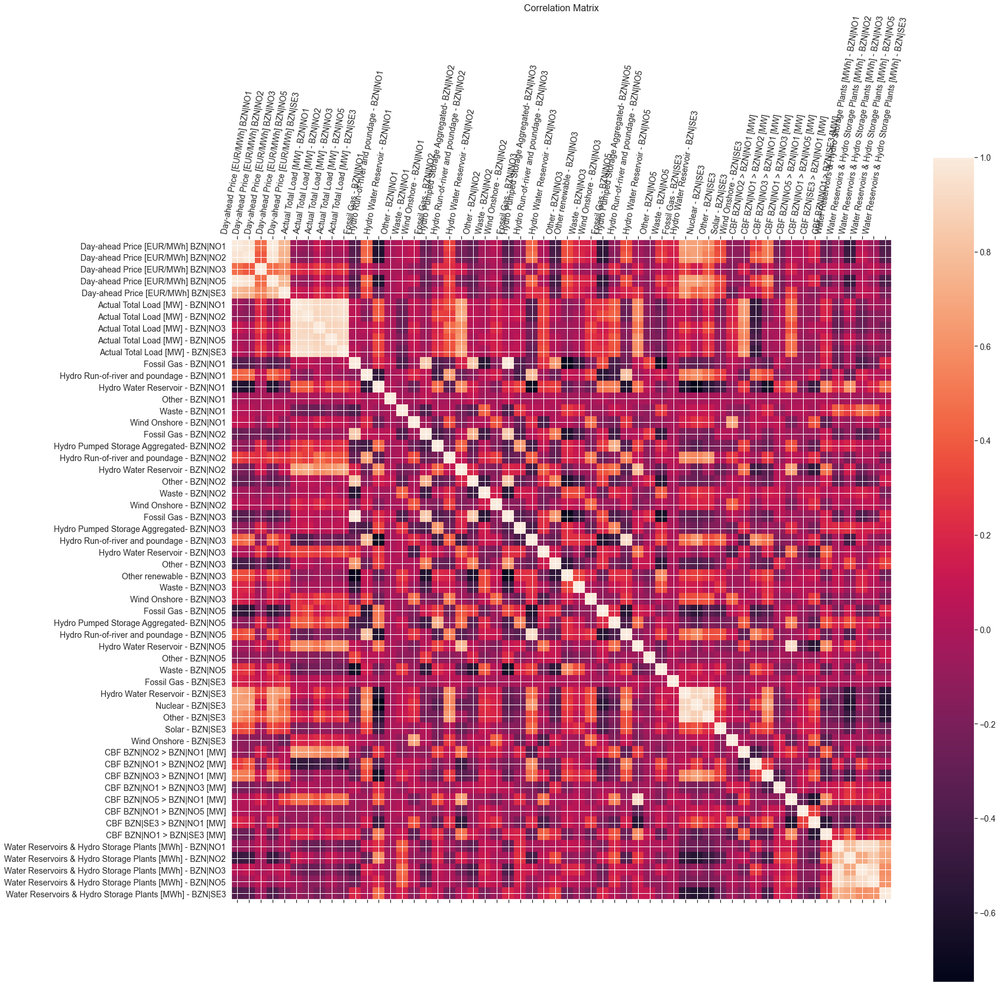

In [540]:
f = plt.figure(figsize=(25, 25))
plt.matshow(df.corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14, rotation=80)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

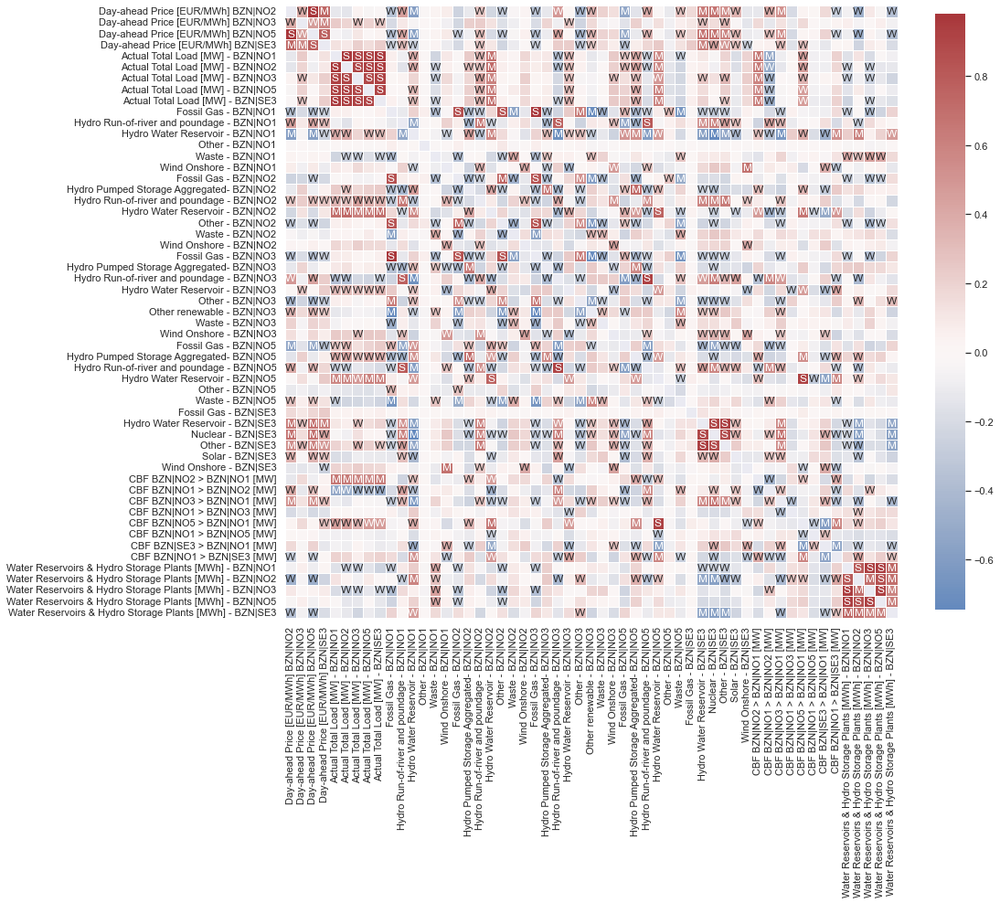

In [541]:
# Computes feature correlation
df_corr = df_without_target.corr(method="pearson")

# Create labels for the correlation matrix
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

### Creating five dataframes from 56 features to study and analyse our data as categories.

In [542]:
# Price category with 0 missing values
price_column_names = ['Day-ahead Price [EUR/MWh] BZN|NO1', 'Day-ahead Price [EUR/MWh] BZN|NO2', 'Day-ahead Price [EUR/MWh] BZN|NO3', 'Day-ahead Price [EUR/MWh] BZN|NO5', 'Day-ahead Price [EUR/MWh] BZN|SE3']
price_columns = df[price_column_names]

df.loc[:, price_column_names].isna().sum()

Day-ahead Price [EUR/MWh] BZN|NO1    0
Day-ahead Price [EUR/MWh] BZN|NO2    0
Day-ahead Price [EUR/MWh] BZN|NO3    0
Day-ahead Price [EUR/MWh] BZN|NO5    0
Day-ahead Price [EUR/MWh] BZN|SE3    0
dtype: int64

In [543]:
# Load category with 4 missing values
load_column_names = ['Actual Total Load [MW] - BZN|NO1','Actual Total Load [MW] - BZN|NO2',
                     'Actual Total Load [MW] - BZN|NO3','Actual Total Load [MW] - BZN|NO5', 'Actual Total Load [MW] - BZN|SE3']
load_columns = df[load_column_names]

# Counts total NaN in load_columns = 4
load_columns.isnull().sum().sum()
load_columns.isna().sum()


Actual Total Load [MW] - BZN|NO1    1
Actual Total Load [MW] - BZN|NO2    1
Actual Total Load [MW] - BZN|NO3    1
Actual Total Load [MW] - BZN|NO5    1
Actual Total Load [MW] - BZN|SE3    0
dtype: int64

In [544]:
# Import and export (CBF) category with 186 missing values
CBF_column_names = ['CBF BZN|NO2 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO2 [MW]',
                    'CBF BZN|NO3 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO3 [MW]',
                    'CBF BZN|NO5 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO5 [MW]',
                    'CBF BZN|SE3 > BZN|NO1 [MW]' , 'CBF BZN|NO1 > BZN|SE3 [MW]']
CBF_columns = df[CBF_column_names]

# Counts total NaN in CBF_columns = 186
CBF_columns.isnull().sum().sum()

CBF_columns.isna().sum()

CBF BZN|NO2 > BZN|NO1 [MW]    31
CBF BZN|NO1 > BZN|NO2 [MW]    31
CBF BZN|NO3 > BZN|NO1 [MW]    31
CBF BZN|NO1 > BZN|NO3 [MW]    31
CBF BZN|NO5 > BZN|NO1 [MW]    31
CBF BZN|NO1 > BZN|NO5 [MW]    31
CBF BZN|SE3 > BZN|NO1 [MW]     0
CBF BZN|NO1 > BZN|SE3 [MW]     0
dtype: int64

In [545]:
# Water Reservoir category with 21 missing values
water_reservoir_column_names = ['Hydro Water Reservoir - BZN|NO1','Hydro Water Reservoir - BZN|NO2',
                     'Hydro Water Reservoir - BZN|NO3','Hydro Water Reservoir - BZN|NO5',
                     'Hydro Water Reservoir - BZN|SE3']
water_reservoir_columns = df[water_reservoir_column_names]

# Counts total NaN in water_reservoir_columns = 21
water_reservoir_columns.isnull().sum().sum()
water_reservoir_columns.isna().sum()

Hydro Water Reservoir - BZN|NO1    5
Hydro Water Reservoir - BZN|NO2    5
Hydro Water Reservoir - BZN|NO3    5
Hydro Water Reservoir - BZN|NO5    5
Hydro Water Reservoir - BZN|SE3    1
dtype: int64

In [546]:
# Generation per unit type category with 174 missing values
## sone5 no wind, sone SE3 no waaste and only with nuclear
generation_names = ['Fossil Gas - BZN|NO1','Fossil Gas - BZN|NO2',
                    'Fossil Gas - BZN|NO3','Fossil Gas - BZN|NO5',
                    'Fossil Gas - BZN|SE3',

                    'Hydro Run-of-river and poundage - BZN|NO1', 'Hydro Run-of-river and poundage - BZN|NO2', 'Hydro Run-of-river and poundage - BZN|NO3', 'Hydro Run-of-river and poundage - BZN|NO5',

                    'Wind Onshore - BZN|NO1', 'Wind Onshore - BZN|NO2', 'Wind Onshore - BZN|NO3', 'Wind Onshore - BZN|SE3', 'Waste - BZN|NO1', 'Waste - BZN|NO2', 'Waste - BZN|NO3',
                    'Waste - BZN|NO5',  'Solar - BZN|SE3', 'Nuclear - BZN|SE3', 'Other - BZN|NO1', 'Other - BZN|NO2', 'Other - BZN|NO3', 'Other - BZN|NO5', 'Other - BZN|SE3',

                    'Hydro Pumped Storage Aggregated- BZN|NO2', 'Hydro Pumped Storage Aggregated- BZN|NO3', 'Hydro Pumped Storage Aggregated- BZN|NO5',
                    'Other renewable - BZN|NO3',

                    'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3'
                    ]
generation_columns = df[generation_names]

# Counts total NaN in Generation_columns = 174
generation_columns.isnull().sum().sum()
generation_columns.isna().sum()



Fossil Gas - BZN|NO1                                        5
Fossil Gas - BZN|NO2                                        6
Fossil Gas - BZN|NO3                                        5
Fossil Gas - BZN|NO5                                        5
Fossil Gas - BZN|SE3                                        1
Hydro Run-of-river and poundage - BZN|NO1                   5
Hydro Run-of-river and poundage - BZN|NO2                   5
Hydro Run-of-river and poundage - BZN|NO3                   5
Hydro Run-of-river and poundage - BZN|NO5                   5
Wind Onshore - BZN|NO1                                      5
Wind Onshore - BZN|NO2                                      5
Wind Onshore - BZN|NO3                                      5
Wind Onshore - BZN|SE3                                      1
Waste - BZN|NO1                                             5
Waste - BZN|NO2                                             5
Waste - BZN|NO3                                             5
Waste - 

In [547]:
a = df['Day-ahead Price [EUR/MWh] BZN|NO1']
min = a.min()
min_row = df[a == a.min()]

min_row

price_columns.describe()

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3
count,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000
mean,92.089895,98.477096,30.802730,91.868445,72.083614
std,102.673358,114.521343,44.767859,102.347340,93.332389
min,-1.970000,-1.970000,-2.080000,-0.090000,-2.080000
25%,12.530000,12.537500,8.090000,12.617500,16.780000
50%,54.950000,57.530000,17.625000,54.850000,39.425000
75%,140.860000,143.380000,39.980000,140.735000,86.072500
max,799.970000,844.000000,590.000000,799.970000,799.970000


Count:
> As we expected all the features have the same amount of records/rows.

Mean :

> As we expected all the features have the same amount of records/rows.

Mean :

> As we expected all the features have the same amount of records/rows.

Mean :




In [548]:
load_columns.describe()

,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3
count,26303.000000,26303.000000,26303.000000,26303.000000,26304.000000
mean,3943.992891,4179.527354,3137.688020,1901.222028,9771.786915
std,1259.769412,748.668751,485.748914,329.930577,2129.143862
min,1446.000000,1595.000000,1751.000000,1036.000000,4778.000000
25%,2922.000000,3574.000000,2748.000000,1647.000000,8110.000000
50%,3755.000000,4070.000000,3097.000000,1847.000000,9504.500000
75%,4856.000000,4719.000000,3499.000000,2137.000000,11267.000000
max,7919.000000,7072.000000,5694.000000,4326.000000,16744.000000


In [549]:
CBF_columns.describe()

,CBF BZN|NO2 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO2 [MW],CBF BZN|NO3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW]
count,26273.000000,26273.000000,26273.000000,26273.000000,26273.000000,26273.000000,26304.000000,26304.000000
mean,606.675637,283.892932,195.820424,12.051726,1398.770753,12.165836,341.181531,454.188412
std,775.680843,502.062816,162.824857,39.269949,798.985462,73.549470,497.663086,569.062045
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,38.000000,0.000000,827.000000,0.000000,0.000000,0.000000
50%,228.000000,0.000000,178.000000,0.000000,1402.000000,0.000000,0.000000,67.000000
75%,1072.000000,393.000000,308.000000,0.000000,1935.000000,0.000000,591.000000,895.000000
max,5402.000000,2423.000000,786.000000,672.000000,3477.000000,1052.000000,2520.000000,2325.000000


In [550]:
water_reservoir_columns.describe()

,Hydro Water Reservoir - BZN|NO1,Hydro Water Reservoir - BZN|NO2,Hydro Water Reservoir - BZN|NO3,Hydro Water Reservoir - BZN|NO5,Hydro Water Reservoir - BZN|SE3
count,26299.000000,26299.000000,26299.000000,26299.000000,26303.000000
mean,1103.822389,4656.133845,1968.761132,3083.884292,296.626012
std,570.337672,1945.905419,508.435498,1111.474135,459.131591
min,58.000000,221.000000,293.000000,297.000000,0.000000
25%,631.500000,3304.000000,1628.000000,2312.500000,0.000000
50%,1156.000000,4655.000000,2011.000000,3023.000000,0.000000
75%,1567.000000,6236.500000,2334.000000,3819.000000,600.000000
max,2276.000000,9185.000000,3379.000000,6326.000000,1873.000000


In [551]:
generation_columns.describe()

,Fossil Gas - BZN|NO1,Fossil Gas - BZN|NO2,Fossil Gas - BZN|NO3,Fossil Gas - BZN|NO5,Fossil Gas - BZN|SE3,Hydro Run-of-river and poundage - BZN|NO1,Hydro Run-of-river and poundage - BZN|NO2,Hydro Run-of-river and poundage - BZN|NO3,Hydro Run-of-river and poundage - BZN|NO5,Wind Onshore - BZN|NO1,...,Other - BZN|SE3,Hydro Pumped Storage Aggregated- BZN|NO2,Hydro Pumped Storage Aggregated- BZN|NO3,Hydro Pumped Storage Aggregated- BZN|NO5,Other renewable - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
count,26299.000000,26298.000000,26299.000000,26299.000000,26303.000000,26299.000000,26299.000000,26299.000000,26299.000000,26299.000000,...,26303.000000,26299.000000,26299.000000,26299.000000,26231.000000,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04
mean,3.827028,0.775002,5.944675,64.101297,0.192069,862.721891,409.213278,315.141336,131.603407,72.174075,...,235.050755,229.757139,47.547511,149.347161,10.091533,3.579091e+06,2.073493e+07,5.731948e+06,9.658894e+06,1.716409e+06
std,8.586362,1.568427,13.466047,34.527678,3.715511,391.915029,204.850469,237.217709,133.805143,64.392015,...,380.117433,273.082643,59.798591,165.416832,6.239853,1.582598e+06,6.634143e+06,2.070706e+06,4.128414e+06,3.500652e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,246.000000,108.000000,0.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,4.853340e+05,6.334677e+06,1.691000e+06,1.624537e+06,8.330000e+05
25%,0.000000,0.000000,0.000000,22.000000,0.000000,589.000000,266.000000,148.000000,42.000000,19.000000,...,0.000000,1.000000,0.000000,0.000000,9.000000,2.165300e+06,1.671733e+07,4.008874e+06,6.311281e+06,1.546000e+06
50%,0.000000,0.000000,0.000000,81.000000,0.000000,768.000000,344.000000,254.000000,80.000000,53.000000,...,0.000000,134.000000,28.000000,86.000000,12.000000,4.014420e+06,2.026900e+07,6.248826e+06,1.016200e+07,1.733000e+06
75%,0.000000,0.000000,0.000000,87.000000,0.000000,1075.000000,496.000000,384.500000,158.000000,116.000000,...,368.000000,359.000000,48.000000,249.000000,13.000000,4.797228e+06,2.427300e+07,7.487797e+06,1.242700e+07,2.019000e+06
max,25.000000,5.000000,59.000000,128.000000,90.000000,1990.000000,1146.000000,1095.000000,630.000000,355.000000,...,1463.000000,972.000000,191.000000,690.000000,25.000000,5.919000e+06,3.338800e+07,8.737000e+06,1.645900e+07,2.245000e+06


### Feature engineering

Create a month column and plot it

df[df[""] == ""].groupby("month")["pts"].sum().plot()